In [ ]:
# Install necessery libraries
!pip install transformers unidecode bertviz wandb

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 66.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 235.5/235.5 kB 29.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 157.6/157.6 kB 24.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 103.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.2/311.2 kB 38.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 133.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 79.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.8/135.8 kB 19.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 89.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.6/190.6 kB 28.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 243.9/243.9 kB 32.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 9.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━

In [ ]:
# Import all libraries
import re
import json
import torch
import random
import colorsys
import networkx as nx
from torch.optim import Adam
from tqdm.notebook import tqdm
from google.colab import drive
from unidecode import unidecode
import matplotlib.pyplot as plt
from IPython.display import display
from bertviz import model_view, head_view
from torch.utils.data import DataLoader, Dataset
from transformers import BertTokenizer, BertForTokenClassification
from transformers.models.bert.modeling_bert import BertForSequenceClassification

drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
# Use cuda if available
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")

In [ ]:
device

device(type='cpu')

In [ ]:
# Define NER labels and relations
list_of_labels = ["Model", "Manufacturer", "Engine type", "Passenger number", "Category", "Date", "Wing type", "Era", "Number of engines", "Country of origin", "ernie",
          "Model Next", "Manufacturer Next", "Engine type Next", "Passenger number Next", "Category Next", "Date Next", "Wing type Next", "Era Next", "Number of engines Next", "Country of origin Next"]

list_of_relations = ["org:created_by", "org:created_in", "org:has_engine_type", "org:has_engines", "org:first_flown_in", "org:first_built_in", "org:has_wing_type", "org:has_passengers", "org:has_category", "org:same_as", "org:in_era", "ernie"]

In [ ]:
# Define NER labels and relations for component 2
list_of_labels_c2 = ["Date", "Time", "Event", "Cause", "Activity", "Solution", "Component", "Participant", "Location", "System", "ernie",
                  "Date Next", "Time Next", "Event Next", "Cause Next", "Activity Next", "Solution Next", "Component Next", "Participant Next", "Location Next", "System Next"]
list_of_relations_c2 = ["org:has_part", "org:has_participant", "org:caused_by", "org:happened_at", "org:happened_on", "org:fixed_by", "org:occurred_at", "org:same_as", "ernie"]

In [ ]:
possible_relations = [
        [True, True, True, True, True, True, True, True, True, True],
        [False, True, False, False, False, False, False, False, False, False],
        [False, False, True, False, False, False, False, False, False, False],
        [False, False, False, True, False, False, False, False, False, False],
        [False, False, False, False, True, False, False, False, False, False],
        [False, False, False, False, False, True, False, False, False, False],
        [False, False, False, False, False, False, True, False, False, False],
        [False, False, False, False, False, False, False, True, False, False],
        [False, False, False, False, False, False, False, False, True, False],
        [False, False, False, False, False, False, False, False, False, True]
    ]

In [ ]:
possible_relations_c2 = [
    #Date   Time   Event  Cause  Activity Solution Component Participant Location System
    [True,  False, False, False, False,   False,   False,    False,      False,   False], # Date
    [False, True , False, False, False,   False,   False,    False,      False,   False], # Time
    [True,  True,  True,  True,  False,   False,   False,    False,      True,    False], # Event
    [False, False, False, True,  False,   True,    False,    False,      False,   False], # Cause
    [False, False, False, False, True,    False,   False,    True,       False,   False], # Activity
    [False, False, False, False, False,   True,    False,    False,      False,   False], # Solution
    [False, False, False, False, False,   False,   True,     False,      False,   False], # Component
    [False, False, False, False, False,   False,   False,    True,       False,   False], # Participant
    [False, False, False, False, False,   False,   False,    False,      True,    False], # Location
    [False, False, False, False, False,   False,   True,     False,      False,   True ]  # System
]

In [ ]:
# Create a DataSequence class for dataloader
class DataSequence(Dataset):
    def __init__(self, x, y):
        self.x = x
        self.y = y

    def __len__(self):
        return len(self.y)

    def __getitem__(self, idx):
        return self.x[idx], torch.tensor(self.y[idx])

In [ ]:
# Remove Chinese or other characters
def remove_chinese_characters(text, cased=False):
    chinese_pattern = re.compile(r'[\u4e00-\u9fff]+', re.UNICODE)
    text_without_chinese = chinese_pattern.sub('', text)

    if cased:
      return unidecode(text_without_chinese)

    return unidecode(text_without_chinese).lower()

In [ ]:
# Class EntityRecognizer
class EntityRecognizer:
  def __init__(self, validation_path, train_path, model_name, batch_size, learning_rate, epochs, component2=False):
    self.validation_path = validation_path
    self.train_path = train_path
    self.model_name = model_name
    self.batch_size = batch_size
    self.learning_rate = learning_rate
    self.epochs = epochs

    if component2:
        self.list_of_labels = list_of_labels_c2
    else:
        self.list_of_labels = list_of_labels

    # Define the tokenizer, model and optimizer
    self.tokenizer = BertTokenizer.from_pretrained(model_name)
    self.model = BertForTokenClassification.from_pretrained(model_name, num_labels=len(self.list_of_labels), output_attentions=True)
    self.optimizer = Adam(self.model.parameters(), lr=self.learning_rate)

    if use_cuda:
      self.model = self.model.cuda()

    # Initialize train and valiation data
    self.train_dataloader = self.initialize_data(train_path)
    self.validation_dataloader = self.initialize_data(validation_path)

  def initialize_data(self, path):
    with open(path, "r") as f:
      data = json.load(f)

    # Tokenize every article in train data
    train_data = []
    data_labels = []
    data_ids = []
    data_tokens = []
    data_mask = []

    for article in data:
      text = remove_chinese_characters(article["text"], False)
      tokenize = self.tokenizer(text, max_length=512, padding="max_length", truncation=True)
      input_ids = tokenize["input_ids"]
      mask = tokenize["attention_mask"]
      tokens = self.tokenizer.convert_ids_to_tokens(input_ids)

      character_index = 0
      labels = []

      for token in tokens:
        if token in ["[PAD]", "[CLS]", "[SEP]"]:
          labels.append("ernie")
          continue

        # Find the token index
        token_index = text.find(token.replace("##",""), character_index)

        if token_index == -1:
          # Test if something goes wrong
          print(token)
          print(character_index)
          print(text)
          1/0

        for label in article["label"]:
          start = label["start"]
          end = label["end"]

          if start <= token_index and token_index < end:
                if start == token_index:
                  labels.append(label["labels"][0])
                  break

                labels.append(label["labels"][0] + " Next")
                break
        else:
          labels.append("ernie")

        character_index += len(token.replace("##",""))

        while character_index < len(text) and text[character_index] == " ":
          character_index += 1

      data_tokens.append(tokens)
      data_labels.append(labels)
      data_ids.append(input_ids)
      data_mask.append(mask)
      train_data.append({"input_ids": torch.tensor(input_ids), "attention_mask": torch.tensor(mask)})

    # Create the train dataloader
    y_labels = self.map_labels_to_indices(self.list_of_labels, data_labels)

    tensor_data = DataSequence(train_data, y_labels)
    train_dataloader = DataLoader(tensor_data, batch_size=self.batch_size)

    return train_dataloader

  def map_labels_to_indices(self, labels, data_labels):
    label_to_index = {label: index for index, label in enumerate(labels)}

    result = []

    for data_label in data_labels:
          result.append([label_to_index[label] for label in data_label])

    return result

  def train(self, logger=None):
    for epoch_num in range(self.epochs):

      total_acc_train = 0
      total_loss_train = 0

      self.model.train()

      for train_text, train_label in self.train_dataloader:

          train_label = train_label.to(device)
          mask = train_text['attention_mask'].squeeze(1).to(device)
          input_id = train_text['input_ids'].squeeze(1).to(device)

          self.optimizer.zero_grad()

          loss, logits, _ = self.model(input_ids=input_id, attention_mask=mask, labels=train_label, return_dict=False)

          for i in range(logits.shape[0]):

            logits_clean = logits[i][mask[i] != 0]
            label_clean = train_label[i][mask[i] != 0]

            predictions = logits_clean.argmax(dim=1)

            acc = (predictions == label_clean).float().mean()
            total_acc_train += acc
            total_loss_train += loss.item()

          loss.backward()
          self.optimizer.step()

      val_acc, val_loss, non_ernie_acc, ernie_acc = self.validate()

      train_loss = total_loss_train / len(self.train_dataloader.dataset)
      train_acc = total_acc_train / len(self.train_dataloader.dataset)

      if logger:
        logger({"train_accuracy": train_acc, "train_loss": train_loss, "accuracy": val_acc, "loss": val_loss, "accuracy_ernie": ernie_acc, "accuracy_non_ernie": non_ernie_acc})

      print(f'Epochs: {epoch_num + 1} | Loss: {train_loss: .3f} | Accuracy: {train_acc: .3f} | Val Loss: {val_loss: .3f} | Val Accuracy: {val_acc: .3f} (non-ernie: {non_ernie_acc: .3f}, ernie: {ernie_acc: .3f})')

  def validate(self):
    self.model.eval()

    total_acc_val = 0
    total_loss_val = 0
    total_acc_non_ernie = 0
    total_acc_ernie = 0
    count_non_ernie = 0
    count_ernie = 0

    for val_text, val_label in self.validation_dataloader:
        val_label = val_label.to(device)
        mask = val_text['attention_mask'].squeeze(1).to(device)
        input_id = val_text['input_ids'].squeeze(1).to(device)

        loss, logits, _ = self.model(input_ids=input_id, attention_mask=mask, labels=val_label, return_dict=False)

        for i in range(logits.shape[0]):

          logits_clean = logits[i][mask[i] != 0]
          label_clean = val_label[i][mask[i] != 0]

          predictions = logits_clean.argmax(dim=1)

          acc = (predictions == label_clean).float().mean()
          total_acc_val += acc
          total_loss_val += loss.item()

          # for j in range(len(label_clean)):
          non_ernie_labels = label_clean[label_clean != self.list_of_labels.index("ernie")]
          non_ernie_predictions = predictions[label_clean != self.list_of_labels.index("ernie")]
          count_non_ernie += len(non_ernie_labels)
          total_acc_non_ernie += (non_ernie_predictions == non_ernie_labels).float().sum()
          ernie_labels = label_clean[label_clean == self.list_of_labels.index("ernie")]
          ernie_predictions = predictions[label_clean == self.list_of_labels.index("ernie")]
          count_ernie += len(ernie_labels)
          total_acc_ernie += (ernie_predictions == ernie_labels).float().sum()
            # if label_clean[j].item() != self.list_of_labels.index("ernie"):
            #   count_non_ernie += 1
            #   # print(label_clean[i].shape)
            #   # print(predictions.shape)
            #   if label_clean[j] == predictions[j]:
            #     total_acc_non_ernie += 1
            # else:
            #   count_ernie += 1

    total_acc_ernie = total_acc_ernie / count_ernie
    total_acc_val = total_acc_val / len(self.validation_dataloader.dataset)
    total_loss_val = total_loss_val / len(self.validation_dataloader.dataset)
    total_acc_non_ernie = total_acc_non_ernie / count_non_ernie

    return total_acc_val, total_loss_val, total_acc_non_ernie, total_acc_ernie

  def predict(self, text):
    text = remove_chinese_characters(text, False)
    tokenize = self.tokenizer(text, max_length=512, padding="max_length", truncation=True)
    input_ids = torch.tensor([tokenize["input_ids"]]).to(device)
    mask =  torch.tensor([tokenize["attention_mask"]]).to(device)
    tokens = self.tokenizer.convert_ids_to_tokens(tokenize["input_ids"])

    logits = self.model(input_ids=input_ids, attention_mask=mask, return_dict=False)[0]
    logits_clean = logits[0][mask[0] != 0]

    predictions = logits_clean.argmax(dim=1)

    index_to_label = {index: label for index, label in enumerate(self.list_of_labels)}

    # Replace indices in predictions with their corresponding labels
    predicted_names = [index_to_label[index] for index in predictions.cpu().numpy()]

    return predicted_names, predictions.cpu().numpy(), tokens

  def extract_entities(self, article):
    # Get predicted entities from our entityRecognizer model
    predicted_labels, predicted_ids, tokens = self.predict(article)
    article = article.lower()

    entities = []

    # Map the tokenized entity outputs to labels
    current_entity = {}
    cursor_index = 0
    for id, token in zip(predicted_ids, tokens):
      if token in ["[CLS]", "[PAD]", "[SEP]"]:
        continue
      token_index = article.find(token.replace("##",""), cursor_index)
      if token_index == -1:
        print(token_index)
        print(token)
        1/0
      if current_entity == {}:
        if id < 10:
          current_entity = {"labels": [self.list_of_labels[id]], "start": token_index}
      else:
        if id <= 10:
          # old entity is done, finish it and make new one
          current_entity["end"] = cursor_index
          entities.append(current_entity)
          if id < 10:
            current_entity = {"labels": [self.list_of_labels[id]], "start": token_index}
          else:
            current_entity = {}

      string_token = token.replace("##", "")
      cursor_index = token_index + len(string_token)

    return entities

In [ ]:
file_path_train = "drive/MyDrive/Colab Notebooks/Entity_Train.json"
file_path_validate = "drive/MyDrive/Colab Notebooks/Entity_Validate.json"
model_name ="prajjwal1/bert-small"
batch_size = 2
learning_rate = 1e-4
epochs = 18

entityRecognizer = EntityRecognizer(file_path_validate, file_path_train, model_name, batch_size, learning_rate, epochs)
entityRecognizer.train()

# Test if the predicted labels are correct for a random article
#predict_labels, predictions, tokens = entityRecognizer.predict("The T-211 is a light aircraft designed in the US by John Thorp in 1945. It is a low-wing monoplane of conventional layout with fixed tricycle undercarriage and a sliding canopy. John Thorp developed the Sky Scooter with lessons learned from developing the Lockheed Little Dipper project in 1944. It bears some family resemblance to the Piper Cherokee, a design that Thorp later contributed to significantly")

Some weights of BertForTokenClassification were not initialized from the model checkpoint at prajjwal1/bert-tiny and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epochs: 1 | Loss:  1.331 | Accuracy:  0.599 | Val Loss:  0.626 | Val Accuracy:  0.637 (non-ernie:  0.000, ernie:  1.000)
Epochs: 2 | Loss:  0.514 | Accuracy:  0.647 | Val Loss:  0.415 | Val Accuracy:  0.637 (non-ernie:  0.000, ernie:  1.000)
Epochs: 3 | Loss:  0.344 | Accuracy:  0.654 | Val Loss:  0.305 | Val Accuracy:  0.668 (non-ernie:  0.074, ernie:  0.990)
Epochs: 4 | Loss:  0.278 | Accuracy:  0.674 | Val Loss:  0.280 | Val Accuracy:  0.667 (non-ernie:  0.094, ernie:  0.981)
Epochs: 5 | Loss:  0.245 | Accuracy:  0.687 | Val Loss:  0.265 | Val Accuracy:  0.676 (non-ernie:  0.143, ernie:  0.975)
Epochs: 6 | Loss:  0.219 | Accuracy:  0.712 | Val Loss:  0.246 | Val Accuracy:  0.711 (non-ernie:  0.237, ernie:  0.971)
Epochs: 7 | Loss:  0.190 | Accuracy:  0.754 | Val Loss:  0.231 | Val Accuracy:  0.747 (non-ernie:  0.310, ernie:  0.975)
Epochs: 8 | Loss:  0.166 | Accuracy:  0.784 | Val Loss:  0.222 | Val Accuracy:  0.774 (non-ernie:  0.366, ernie:  0.976)
Epochs: 9 | Loss:  0.145 | Accur

In [ ]:
pred_labels, pred_ind, pred_tokens = entityRecognizer.predict("The twinjet is powered by General Electric GEnx or Rolls-Royce Trent 1000 high-bypass turbofans.")
for (label, token) in zip(pred_labels, pred_tokens):
  if token != "[PAD]":
    print(f'{token} - {label}')

[CLS] - ernie
the - ernie
twin - Model
##jet - Model Next
is - ernie
powered - ernie
by - ernie
general - Manufacturer
electric - Manufacturer Next
gen - Model
##x - Model Next
or - ernie
rolls - ernie
- - ernie
royce - Manufacturer Next
trent - Model
1000 - ernie
high - Wing type
- - Wing type Next
bypass - Engine type Next
turbo - Engine type
##fan - Engine type Next
##s - Engine type Next
. - ernie
[SEP] - ernie


In [ ]:
# Create class RelationRecogizer
class RelationRecognizer:
  def __init__(self, validation_path, train_path, model_name, batch_size, learning_rate, epochs, component2=False):
    self.validation_path = validation_path
    self.train_path = train_path
    self.model_name = model_name
    self.batch_size = batch_size
    self.learning_rate = learning_rate
    self.epochs = epochs

    if component2:
        self.list_of_labels = list_of_labels_c2
        self.list_of_relations = list_of_relations_c2
        self.possible_relations = possible_relations_c2
    else:
        self.list_of_labels = list_of_labels
        self.list_of_relations = list_of_relations
        self.possible_relations = possible_relations

    # Define the tokenizer, model and optimizer
    self.tokenizer = BertTokenizer.from_pretrained(model_name)
    self.model = BertForSequenceClassification.from_pretrained(model_name, num_labels=len(self.list_of_relations), output_attentions=True)
    self.optimizer = Adam(self.model.parameters(), lr=self.learning_rate)

    if use_cuda:
      self.model = self.model.cuda()

    # Initialize train and valiation data
    self.train_dataloader = self.initialize_data(train_path)
    self.validation_dataloader = self.initialize_data(validation_path)

  def add_negative_relations(self, data):
    label_to_index = {label: index for index, label in enumerate(self.list_of_labels)}

    full_relations = []

    for article in data:
      entities = {ann["id"]: ann["value"] for ann in article['annotations'][0]["result"] if ann["type"] == "labels"}
      relations = [ann for ann in article['annotations'][0]["result"] if ann["type"] == "relation"]

      negative_relations = []
      count = 0

      for i in range(len(entities)):
        for j in range(i+1, len(entities)):
          # Check if there can be a relation between the entities

          from_entity = list(entities.items())[i]
          to_entity = list(entities.items())[j]

          from_types = [label_to_index[label] for label in from_entity[1]["labels"]]
          to_types = [label_to_index[label] for label in to_entity[1]["labels"]]

          for from_type in from_types:
            for to_type in to_types:
              if self.possible_relations[from_type][to_type] or self.possible_relations[to_type][from_type]:
                found = False
                for relation in relations:
                  if relation["direction"] == "right":
                    if from_entity[0] == relation["from_id"] and to_entity[0] == relation["to_id"]:
                      full_relations.append({"labels": relation["labels"], "obj_start": from_entity[1]["start"], "obj_end": from_entity[1]["end"], "obj_type": from_type, "sub_start": to_entity[1]["start"], "sub_end": to_entity[1]["end"], "sub_type": to_type, "article": article["data"]["text"]})
                      full_relations.append({"labels": ["ernie"], "obj_start": to_entity[1]["start"], "obj_end": to_entity[1]["end"], "obj_type": to_type, "sub_start": from_entity[1]["start"], "sub_end": from_entity[1]["end"], "sub_type": from_type, "article": article["data"]["text"]})
                      found = True
                    elif from_entity[0] == relation["to_id"] and to_entity[0] == relation["from_id"]:
                      full_relations.append({"labels": relation["labels"], "obj_start": to_entity[1]["start"], "obj_end": to_entity[1]["end"], "obj_type": to_type, "sub_start": from_entity[1]["start"], "sub_end": from_entity[1]["end"], "sub_type": from_type, "article": article["data"]["text"]})
                      full_relations.append({"labels": ["ernie"], "obj_start": from_entity[1]["start"], "obj_end": from_entity[1]["end"], "obj_type": from_type, "sub_start": to_entity[1]["start"], "sub_end": to_entity[1]["end"], "sub_type": to_type, "article": article["data"]["text"]})
                      found = True
                  else:
                    if from_entity[0] == relation["from_id"] and to_entity[0] == relation["to_id"]:
                      full_relations.append({"labels": relation["labels"], "obj_start": to_entity[1]["start"], "obj_end": to_entity[1]["end"], "obj_type": to_type, "sub_start": from_entity[1]["start"], "sub_end": from_entity[1]["end"], "sub_type": from_type, "article": article["data"]["text"]})
                      full_relations.append({"labels": ["ernie"], "obj_start": from_entity[1]["start"], "obj_end": from_entity[1]["end"], "obj_type": from_type, "sub_start": to_entity[1]["start"], "sub_end": to_entity[1]["end"], "sub_type": to_type, "article": article["data"]["text"]})
                      found = True
                    elif from_entity[0] == relation["to_id"] and to_entity[0] == relation["from_id"]:
                      full_relations.append({"labels": relation["labels"], "obj_start": from_entity[1]["start"], "obj_end": from_entity[1]["end"], "obj_type": from_type, "sub_start": to_entity[1]["start"], "sub_end": to_entity[1]["end"], "sub_type": to_type, "article": article["data"]["text"]})
                      full_relations.append({"labels": ["ernie"], "obj_start": to_entity[1]["start"], "obj_end": to_entity[1]["end"], "obj_type": to_type, "sub_start": from_entity[1]["start"], "sub_end": from_entity[1]["end"], "sub_type": from_type, "article": article["data"]["text"]})
                      found = True
                if not found and self.possible_relations[from_type][to_type]:
                  count += 1
                  negative_relations.append({"labels": ['ernie'], "obj_start": from_entity[1]["start"], "obj_end": from_entity[1]["end"], "obj_type": from_type, "sub_start": to_entity[1]["start"], "sub_end": to_entity[1]["end"], "sub_type": to_type, "article": article["data"]["text"]})
                  negative_relations.append({"labels": ['ernie'], "obj_start": to_entity[1]["start"], "obj_end": to_entity[1]["end"], "obj_type": to_type, "sub_start": from_entity[1]["start"], "sub_end": from_entity[1]["end"], "sub_type": from_type, "article": article["data"]["text"]})

      # Combine possitive and negative relations
      filtered_neg = random.sample(negative_relations, min(len(relations), len(negative_relations)))
      full_relations += filtered_neg

    return full_relations

  def objectify_article(self, data):
    for entry in data:
        # Get the original article text
        article = entry['article']

        # Define the labels to be added
        obj_label = " [OBJ] "
        sub_label = " [SUB] "

        # Insert the labels at the specified positions
        obj_start = entry['obj_start']
        obj_end = entry['obj_end']
        sub_start = entry['sub_start']
        sub_end = entry['sub_end']

        # Create the modified article text
        modified_article = (
            article[:obj_start] + obj_label + article[obj_start:obj_end] + obj_label +
            article[obj_end:sub_start] + sub_label + article[sub_start:sub_end] + sub_label +
            article[sub_end:]
        )

        # Update the dictionary with the modified article
        entry['article'] = modified_article

    return data

  def initialize_data(self, path):
    with open(path, "r") as f:
      data = json.load(f)

    # Create and append negative relations
    data = self.add_negative_relations(data)

    # Put [OBJ] and [SUB] tokens around the articles
    data = self.objectify_article(data)

    # Tokenize the train data
    tokenized_data = []

    for res in data:
      text = remove_chinese_characters(res["article"])
      tokenize = self.tokenizer(text, max_length=512, padding="max_length", truncation=True)

      input_ids = torch.tensor(tokenize["input_ids"])
      mask = torch.tensor(tokenize["attention_mask"])

      tokenized_data.append({"input_ids": input_ids, "attention_mask": mask})

    rel_labels = [res["labels"][0] for res in data]
    label_to_index = {label: index for index, label in enumerate(self.list_of_relations)}

    y_relation_labels = [label_to_index[rel] for rel in rel_labels]

    tensor_relation_data = DataSequence(tokenized_data, y_relation_labels)
    relation_dataloader = DataLoader(tensor_relation_data, batch_size=self.batch_size)

    return relation_dataloader

  def train(self, logger=None):
    for epoch_num in range(self.epochs):

      total_acc_train = 0
      total_loss_train = 0

      self.model.train()

      for train_text, train_label in tqdm(self.train_dataloader):

          train_label = train_label.to(device)
          mask = train_text['attention_mask'].squeeze(1).to(device)
          input_id = train_text['input_ids'].squeeze(1).to(device)

          self.optimizer.zero_grad()

          loss, logits, _ = self.model(input_ids=input_id, attention_mask=mask, labels=train_label, return_dict=False)

          for i in range(logits.shape[0]):

            predictions = logits[i].argmax()

            acc = (predictions == train_label[i]).float().mean()
            total_acc_train += acc
            total_loss_train += loss.item()

          loss.backward()
          self.optimizer.step()

      val_acc, val_loss, non_ernie_acc, ernie_acc = self.validate()

      train_loss = total_loss_train / len(self.train_dataloader.dataset)
      train_acc = total_acc_train / len(self.train_dataloader.dataset)

      if logger:
        logger({"train_accuracy": train_acc, "train_loss": train_loss, "accuracy": val_acc, "loss": val_loss, "accuracy_ernie": ernie_acc, "accuracy_non_ernie": non_ernie_acc})

      print(f'Epochs: {epoch_num + 1} | Loss: {train_loss: .3f} | Accuracy: {train_acc: .3f} | Val Loss: {val_loss: .3f} | Val Accuracy: {val_acc: .3f} (non-ernie: {non_ernie_acc: .3f}, ernie: {ernie_acc: .3f})')

  def validate(self):
    self.model.eval()

    total_acc_val = 0
    total_loss_val = 0
    total_acc_non_ernie = 0
    count_non_ernie = 0

    self.model.train()

    for val_text, val_label in tqdm(self.validation_dataloader):

        val_label = val_label.to(device)
        mask = val_text['attention_mask'].squeeze(1).to(device)
        input_id = val_text['input_ids'].squeeze(1).to(device)

        loss, logits, _ = self.model(input_ids=input_id, attention_mask=mask, labels=val_label, return_dict=False)

        for i in range(logits.shape[0]):

          predictions = logits[i].argmax()

          acc = (predictions == val_label[i]).float().mean()
          total_acc_val += acc
          total_loss_val += loss.item()

          if val_label[i].item() != len(self.list_of_relations) - 1:
            count_non_ernie += 1
            if val_label[i] == predictions:
              total_acc_non_ernie += 1

    total_acc_ernie = (total_acc_val - total_acc_non_ernie) / (len(self.validation_dataloader.dataset) - count_non_ernie)
    total_acc_val = total_acc_val / len(self.validation_dataloader.dataset)
    total_loss_val = total_loss_val / len(self.validation_dataloader.dataset)
    total_acc_non_ernie = total_acc_non_ernie / count_non_ernie

    return total_acc_val, total_loss_val, total_acc_non_ernie, total_acc_ernie

  def predict(self, text):
    text = remove_chinese_characters(text)
    tokenize = self.tokenizer(text, max_length=512, padding="max_length", truncation=True)
    input_ids = torch.tensor([tokenize["input_ids"]]).to(device)
    mask =  torch.tensor([tokenize["attention_mask"]]).to(device)

    logits = self.model(input_ids=input_ids, attention_mask=mask, return_dict=False)[0]

    prediction = logits.argmax(dim=1)

    index_to_rel = {index: rel for index, rel in enumerate(self.list_of_relations)}
    predicted_relation = index_to_rel[prediction.cpu().numpy()[0]]

    return predicted_relation

  def extract_relations(self, entities, text):
    label_to_index = {label: index for index, label in enumerate(self.list_of_labels)}
    full_relations = []

    for i in range(len(entities)):
      for j in range(len(entities)):
        # Check if there can be a relation between the entities
        if i == j:
          continue

        from_entity = entities[i]
        to_entity = entities[j]

        from_types = [label_to_index[label] for label in from_entity["labels"]]
        to_types = [label_to_index[label] for label in to_entity["labels"]]

        for from_type in from_types:
          for to_type in to_types:
            if self.possible_relations[from_type][to_type] or self.possible_relations[to_type][from_type]:
              if self.possible_relations[from_type][to_type]:
                full_relations.append({"fromlabel": from_entity["labels"], "tolabel": to_entity["labels"],  "fromText": text[from_entity["start"]: from_entity["end"]], "toText": text[to_entity["start"]: to_entity["end"]],  "obj_start": from_entity["start"], "obj_end": from_entity["end"], "sub_start": to_entity["start"], "sub_end": to_entity["end"], "article": text})

    # Objectify the realtions ([SUB] and [OBJ])
    obj_relations = self.objectify_article(full_relations)

    # Call relationRecognition model and output subjects, objects, relations and a helper models
    models = {}

    subjects = set()
    objects = set()
    relations = []

    for relation in obj_relations:
      subject = relation['fromText']
      obj = relation['toText']
      predict_relation = self.predict(relation["article"])

      subjects.add(subject)
      objects.add(obj)

      models[subject] = relation['fromlabel']
      models[obj] = relation['tolabel']

      relations.append([subject, predict_relation, obj])

    return obj_relations, relations, models, subjects, objects


In [ ]:
file_path_train = "drive/MyDrive/Colab Notebooks/Relation_Train.json"
file_path_validate = "drive/MyDrive/Colab Notebooks/Relation_Validate.json"
model_name = "prajjwal1/bert-small"
batch_size = 20
learning_rate = 1e-5
epochs = 20

relationRecognizer = RelationRecognizer(file_path_validate, file_path_train, model_name, batch_size, learning_rate, epochs)
# relationRecognizer.model = BertForSequenceClassification.from_pretrained(model_name, num_labels=len(list_of_relations), output_attentions=True).cuda()
# relationRecognizer.optimizer = Adam(relationRecognizer.model.parameters(), lr=learning_rate)
# relationRecognizer.epochs = epochs
relationRecognizer.train()

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at prajjwal1/bert-mini and are newly initialized: ['classifier.weight', 'classifier.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


  0%|          | 0/322 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

Epochs: 1 | Loss:  1.455 | Accuracy:  0.648 | Val Loss:  1.305 | Val Accuracy:  0.660 (non-ernie:  0.000, ernie:  1.000)


  0%|          | 0/322 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

Epochs: 2 | Loss:  1.254 | Accuracy:  0.661 | Val Loss:  1.164 | Val Accuracy:  0.684 (non-ernie:  0.077, ernie:  0.996)


  0%|          | 0/322 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

Epochs: 3 | Loss:  1.134 | Accuracy:  0.677 | Val Loss:  1.067 | Val Accuracy:  0.685 (non-ernie:  0.107, ernie:  0.983)


  0%|          | 0/322 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

Epochs: 4 | Loss:  1.001 | Accuracy:  0.696 | Val Loss:  0.972 | Val Accuracy:  0.698 (non-ernie:  0.193, ernie:  0.959)


  0%|          | 0/322 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

Epochs: 5 | Loss:  0.850 | Accuracy:  0.740 | Val Loss:  0.829 | Val Accuracy:  0.740 (non-ernie:  0.352, ernie:  0.940)


  0%|          | 0/322 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

Epochs: 6 | Loss:  0.686 | Accuracy:  0.791 | Val Loss:  0.747 | Val Accuracy:  0.756 (non-ernie:  0.491, ernie:  0.892)


  0%|          | 0/322 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

Epochs: 7 | Loss:  0.569 | Accuracy:  0.830 | Val Loss:  0.717 | Val Accuracy:  0.767 (non-ernie:  0.579, ernie:  0.864)


  0%|          | 0/322 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

Epochs: 8 | Loss:  0.478 | Accuracy:  0.853 | Val Loss:  0.628 | Val Accuracy:  0.797 (non-ernie:  0.589, ernie:  0.904)


  0%|          | 0/322 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

Epochs: 9 | Loss:  0.420 | Accuracy:  0.873 | Val Loss:  0.653 | Val Accuracy:  0.783 (non-ernie:  0.598, ernie:  0.879)


  0%|          | 0/322 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

Epochs: 10 | Loss:  0.370 | Accuracy:  0.894 | Val Loss:  0.613 | Val Accuracy:  0.808 (non-ernie:  0.686, ernie:  0.871)


  0%|          | 0/322 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

Epochs: 11 | Loss:  0.334 | Accuracy:  0.900 | Val Loss:  0.630 | Val Accuracy:  0.814 (non-ernie:  0.648, ernie:  0.899)


  0%|          | 0/322 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

Epochs: 12 | Loss:  0.304 | Accuracy:  0.911 | Val Loss:  0.662 | Val Accuracy:  0.797 (non-ernie:  0.695, ernie:  0.850)


  0%|          | 0/322 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

Epochs: 13 | Loss:  0.274 | Accuracy:  0.921 | Val Loss:  0.657 | Val Accuracy:  0.825 (non-ernie:  0.636, ernie:  0.922)


  0%|          | 0/322 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

Epochs: 14 | Loss:  0.257 | Accuracy:  0.927 | Val Loss:  0.675 | Val Accuracy:  0.823 (non-ernie:  0.571, ernie:  0.953)


  0%|          | 0/322 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

Epochs: 15 | Loss:  0.224 | Accuracy:  0.940 | Val Loss:  0.615 | Val Accuracy:  0.831 (non-ernie:  0.707, ernie:  0.895)


  0%|          | 0/322 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

Epochs: 16 | Loss:  0.206 | Accuracy:  0.946 | Val Loss:  0.664 | Val Accuracy:  0.828 (non-ernie:  0.616, ernie:  0.938)


  0%|          | 0/322 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

Epochs: 17 | Loss:  0.190 | Accuracy:  0.953 | Val Loss:  0.664 | Val Accuracy:  0.837 (non-ernie:  0.664, ernie:  0.926)


  0%|          | 0/322 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

Epochs: 18 | Loss:  0.173 | Accuracy:  0.955 | Val Loss:  0.619 | Val Accuracy:  0.836 (non-ernie:  0.662, ernie:  0.926)


  0%|          | 0/322 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

Epochs: 19 | Loss:  0.156 | Accuracy:  0.961 | Val Loss:  0.650 | Val Accuracy:  0.850 (non-ernie:  0.679, ernie:  0.938)


  0%|          | 0/322 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

Epochs: 20 | Loss:  0.143 | Accuracy:  0.965 | Val Loss:  0.689 | Val Accuracy:  0.836 (non-ernie:  0.654, ernie:  0.929)


  0%|          | 0/322 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

Epochs: 21 | Loss:  0.142 | Accuracy:  0.964 | Val Loss:  0.702 | Val Accuracy:  0.812 (non-ernie:  0.705, ernie:  0.867)


  0%|          | 0/322 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

Epochs: 22 | Loss:  0.129 | Accuracy:  0.969 | Val Loss:  0.683 | Val Accuracy:  0.810 (non-ernie:  0.748, ernie:  0.842)


  0%|          | 0/322 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

Epochs: 23 | Loss:  0.121 | Accuracy:  0.970 | Val Loss:  0.645 | Val Accuracy:  0.836 (non-ernie:  0.732, ernie:  0.890)


  0%|          | 0/322 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

Epochs: 24 | Loss:  0.113 | Accuracy:  0.972 | Val Loss:  0.671 | Val Accuracy:  0.845 (non-ernie:  0.700, ernie:  0.919)


  0%|          | 0/322 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

Epochs: 25 | Loss:  0.098 | Accuracy:  0.973 | Val Loss:  0.686 | Val Accuracy:  0.825 (non-ernie:  0.750, ernie:  0.863)


  0%|          | 0/322 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

Epochs: 26 | Loss:  0.091 | Accuracy:  0.977 | Val Loss:  0.734 | Val Accuracy:  0.821 (non-ernie:  0.739, ernie:  0.863)


  0%|          | 0/322 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

Epochs: 27 | Loss:  0.091 | Accuracy:  0.975 | Val Loss:  0.714 | Val Accuracy:  0.823 (non-ernie:  0.723, ernie:  0.875)


  0%|          | 0/322 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

Epochs: 28 | Loss:  0.080 | Accuracy:  0.981 | Val Loss:  0.655 | Val Accuracy:  0.848 (non-ernie:  0.734, ernie:  0.907)


  0%|          | 0/322 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

Epochs: 29 | Loss:  0.075 | Accuracy:  0.981 | Val Loss:  0.732 | Val Accuracy:  0.825 (non-ernie:  0.754, ernie:  0.862)


  0%|          | 0/322 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

Epochs: 30 | Loss:  0.072 | Accuracy:  0.981 | Val Loss:  0.706 | Val Accuracy:  0.837 (non-ernie:  0.729, ernie:  0.892)


In [ ]:
# Test if the predicted labels are correct for a random  (objectified) article
predict_relation = relationRecognizer.predict("The [OBJ] T-211 [OBJ] is a [SUB] light aircraft [SUB] designed in the US by John Thorp in 1945. It is a low-wing monoplane of conventional layout with fixed tricycle undercarriage and a sliding canopy. John Thorp developed the Sky Scooter with lessons learned from developing the Lockheed Little Dipper project in 1944. It bears some family resemblance to the Piper Cherokee, a design that Thorp later contributed to significantly")
print(predict_relation) # expected output: category

org:has_category


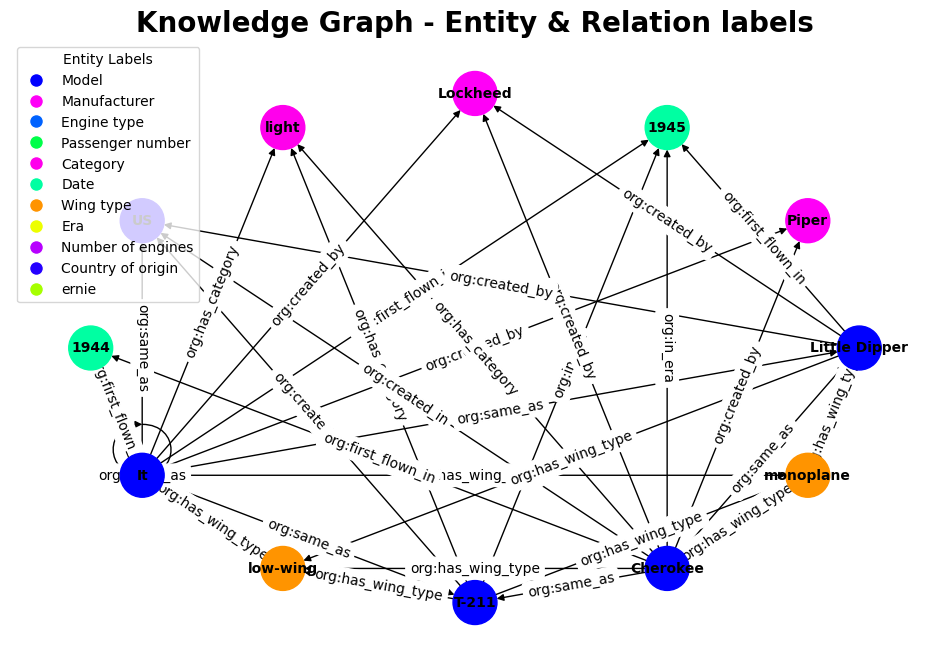

In [ ]:
# Create a full pipeline for a given arbitraty article - output knowladge graph with model's identified entities and relations between.
# Output for entity and relation recognition models an attention visisualization to track where the models focus when outputing the predictions

def visualize_attention_entities(article):
  model = entityRecognizer.model
  tokenizer = entityRecognizer.tokenizer
  inputs = tokenizer.encode(article, return_tensors='pt').to(device)
  outputs = model(inputs)
  attention = outputs[-1]
  tokens = tokenizer.convert_ids_to_tokens(inputs[0])

  # Use BertViz library to visualize the attentions per layer and head
  view = head_view(attention, tokens, html_action="return")
  view.data = "<h1> Entity Attentions </h1>" + view.data
  display(view)

def visualize_attention_relations(article, obj_relations):
  model = relationRecognizer.model
  tokenizer = relationRecognizer.tokenizer
  inputs = tokenizer.encode(obj_relations[0]['article'], return_tensors='pt').to(device)
  outputs = model(inputs)
  attention = outputs[-1]
  tokens = tokenizer.convert_ids_to_tokens(inputs[0])

  # Use BertViz library to visualize the attentions per layer and head
  view = head_view(attention, tokens, html_action="return")
  view.data = "<h1> Relation Attentions </h1>" + view.data
  display(view)

  # model_view(attention, tokens) # additional visualization if needed

def knowledge_graph(relations, models, subjects, objects):
    def colors(el):
      # make colors based on entity values
      color_palette = {}

      for l in el:
          hue = random.random()
          rgb_color = tuple(int(x * 255) for x in colorsys.hsv_to_rgb(hue, 1, 1))
          color_hex = "#{:02x}{:02x}{:02x}".format(rgb_color[0], rgb_color[1], rgb_color[2])
          color_palette[l] = color_hex

      return color_palette

    # Create and populate the knowledge graph
    knowledge_graph = nx.DiGraph()

    for s in subjects:
      knowledge_graph.add_node(s)
    for o in objects:
      knowledge_graph.add_node(o)

    for r in relations:
      if r[1] != "ernie":
        knowledge_graph.add_edge(r[0], r[2], relation=r[1])

    pos = nx.shell_layout(knowledge_graph)

    intersection = subjects.intersection(objects)

    no_next_labels = [l for l in list_of_labels if "Next" not in l]
    color_palette = colors(no_next_labels)

    # Define node colors for subjects and objects
    node_colors = {
        node: color_palette[models[str(node)][0]]
        for node in knowledge_graph.nodes()
    }

    plt.figure(figsize=(12, 8))
    plt.title('Knowledge Graph - Entity & Relation labels', fontweight="bold", fontsize=20)

    # Draw the graph with node labels and edge labels
    nx.draw(knowledge_graph, pos, with_labels=True, node_size=1000, node_color=list(node_colors.values()), font_size=10, font_weight='bold')
    edge_labels = {(u, v): d['relation'] for u, v, d in knowledge_graph.edges(data=True)}
    nx.draw_networkx_edge_labels(knowledge_graph, pos, edge_labels=edge_labels)

    legend_labels = color_palette
    legend_handles = [plt.Line2D([0], [0], marker='o', color='w', label=label, markerfacecolor=color, markersize=10) for label, color in legend_labels.items()]
    plt.legend(handles=legend_handles, title='Entity Labels', loc='upper left')

    plt.show()

def article_pipeline(article):
  # Predict entities
  entities = entityRecognizer.extract_entities(article)
  visualize_attention_entities(article)

  # Predict relations
  obj_relations, relations, models, subjects, objects = relationRecognizer.extract_relations(entities, article)
  visualize_attention_relations(article, obj_relations)

  # Visualize knowledge graph
  knowledge_graph(relations, models, subjects, objects)

# Input random article
article_pipeline("The T-211 is a light aircraft designed in the US by John Thorp in 1945. It is a low-wing monoplane of conventional layout with fixed tricycle undercarriage and a sliding canopy. John Thorp developed the Sky Scooter with lessons learned from developing the Lockheed Little Dipper project in 1944. It bears some family resemblance to the Piper Cherokee, a design that Thorp later contributed to significantly")

# Ablation

In [ ]:
import wandb

!wandb login

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit: 
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


## NER

In [ ]:
def get_NER_function(component2=False):
    def train_model_NER(config=None):
      with wandb.init(config=config):
        if component2:
            file_path_train = "drive/MyDrive/Colab Notebooks/Entity_Train_C2.json"
            file_path_validate = "drive/MyDrive/Colab Notebooks/Entity_Validate_C2.json"
        else:
            file_path_train = "drive/MyDrive/Colab Notebooks/Entity_Train.json"
            file_path_validate = "drive/MyDrive/Colab Notebooks/Entity_Validate.json"
        model_name = wandb.config.model_name
        batch_size = wandb.config.batch_size
        learning_rate = wandb.config.learning_rate
        epochs = wandb.config.epochs

        entityRecognizer = EntityRecognizer(file_path_validate, file_path_train, model_name, batch_size, learning_rate, epochs, component2)
        entityRecognizer.train(logger=wandb.log)

    return train_model_NER

In [ ]:
# Example sweep configuration
sweep_config = {
    "name": "NER grid",
    "metric": {"name": "accuracy", "goal": "maximize"},
    "method": "grid",
    "parameters": {
        "batch_size": {"values": [20]},
        "learning_rate": {"values": [1e-5, 5e-5, 1e-4, 5e-4]},
        # "learning_rate": {"min": 1e-6, "max": 1e-3, "distribution": "log_uniform_values"}, # When using a distribution, the method should be bayes
        "epochs": {"values": [20]},
        "model_name": {"values": ["prajjwal1/bert-tiny", "prajjwal1/bert-mini", "prajjwal1/bert-small"]}
    }
}

sweep_id = wandb.sweep(sweep=sweep_config, project="Text Mining NER", entity="jellypuddy")

Create sweep with ID: szmnltqd
Sweep URL: https://wandb.ai/jellypuddy/Text%20Mining%20NER/sweeps/szmnltqd


In [ ]:
component2 = False
wandb.agent(sweep_id, function=get_NER_function(component2), project="Text Mining NER", entity="jellypuddy")

## REL

In [ ]:
def get_REL_function(component2=False):
    def train_model_REL(config=None):
      with wandb.init(config=config):
        if component2:
            file_path_train = "drive/MyDrive/Colab Notebooks/Relation_Train_C2.json"
            file_path_validate = "drive/MyDrive/Colab Notebooks/Relation_Validate_C2.json"
        else:
            file_path_train = "drive/MyDrive/Colab Notebooks/Relation_Train.json"
            file_path_validate = "drive/MyDrive/Colab Notebooks/Relation_Validate.json"
        model_name = wandb.config.model_name
        batch_size = wandb.config.batch_size
        learning_rate = wandb.config.learning_rate
        epochs = wandb.config.epochs

        relationRecognizer = RelationRecognizer(file_path_validate, file_path_train, model_name, batch_size, learning_rate, epochs, component2)
        relationRecognizer.train(logger=wandb.log)

    return train_model_REL

In [ ]:
#Example sweep configuration
sweep_config = {
    "name": "REL grid",
    "metric": {"name": "accuracy", "goal": "maximize"},
    "method": "grid",
    "parameters": {
        "batch_size": {"values": [20]},
        "learning_rate": {"values": [1e-5, 5e-5, 1e-4, 5e-4]},
        # "learning_rate": {"min": 1e-6, "max": 1e-3, "distribution": "log_uniform_values"}, # When using a distribution, the method should be bayes
        "epochs": {"values": [20]},
        "model_name": {"values": ["prajjwal1/bert-tiny", "prajjwal1/bert-mini", "prajjwal1/bert-small"]}
    }
}

sweep_id = wandb.sweep(sweep=sweep_config, project="Text Mining REL", entity="jellypuddy")

Create sweep with ID: b87mpbjc
Sweep URL: https://wandb.ai/jellypuddy/Text%20Mining%20REL/sweeps/b87mpbjc


In [ ]:
component2 = False
wandb.agent(sweep_id, function=get_REL_function(component2), project="Text Mining REL", entity="jellypuddy")

wandb: Agent Starting Run: gxiuh318 with config:
wandb: 	batch_size: 20
wandb: 	epochs: 10
wandb: 	learning_rate: 0.00020438313848516736
wandb: 	model_name: prajjwal1/bert-tiny


Some weights of BertForSequenceClassification were not initialized from the model checkpoint at prajjwal1/bert-tiny and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
